# <span style='text-align: center; color:orange; font-weight:bold'>Classification Fine-Tuning for Binary Sentiment Task with IndoBERT</span>

## **1 Experiment Setup**
This experiment involves encoder-only model, particularly [IndoBERT](https://arxiv.org/pdf/2011.00677). Encoder-only model is suitable for classification task, including sentiment analysis. IndoBERT is a part of BERT (Bidirectional Encoder Representations from Transformers) family models, and it is optimized for Indonesian language. In this experiment, the base variant is selected over the large variant ([indobert-large-p1](https://huggingface.co/indobenchmark/indobert-large-p1)) as the base version is lighter, making it faster to train and more time-efficient.

In addition, encoder-only model is more suitable for the need of classification task, including sentiment analysis, even though decoder-only model, e.g., Llama, can also perform the task with its generative approach. Decode-only model is specifically designed for generating text so despite its capability of performing classification, the output is not as optimized as the encoder-only model. Furthermore, IndoBert uses BERT tokenizer which is supporterd by the transformers_interpret

### **1.1 Prepare Dependencies**

In [1]:
%%capture

# install requirements
!pip uninstall unsloth -y && pip install --upgrade --no-cache-dir --no-deps git+https://github.com/unslothai/unsloth.git
!pip install -q bitsandbytes triton unsloth-zoo transformers datasets torchinfo huggingface_hub evaluate
!pip install -q lime shap transformers_interpret bertviz ferret-xai

In [2]:
# import libraries
from google.colab import drive
import pandas as pd
import re
import numpy as np
from torchinfo import summary
import torch
import torch.nn.functional as F
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix
)
import seaborn as sns
import matplotlib.pyplot as plt
from datasets import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
)
from huggingface_hub import login, whoami
from lime.lime_text import LimeTextExplainer
import time
from transformers import pipeline
import shap
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy
from huggingface_hub import HfApi
from transformers_interpret import SequenceClassificationExplainer
from bertviz import head_view

### **1.2 Prepare Data**

In [5]:
# import dataset
df = pd.read_csv('data/cleaned_data.csv',
                 usecols=['CustomerReview', 'Sentiment'])

# check snippet of dataset
df.head()

,CustomerReview,Sentiment
0,Alhamdulillah berfungsi dengan baik. Packaging...,Positive
1,"barang bagus dan respon cepat, harga bersaing ...",Positive
2,"barang bagus, berfungsi dengan baik, seler ram...",Positive
3,bagus sesuai harapan penjual nya juga ramah. t...,Positive
4,"Barang Bagus, pengemasan Aman, dapat Berfungsi...",Positive


**Comment**: As not all columns will be used in the modeling phase, only two columns are specified in the data import, namely `CustomerReview` and `Sentiment`. Just for the records, the prior column contains customer reviews on products they bought on Tokopedia, and the latter column lists the corresponding sentiment label for each review. In addition to the column names, it is important to point out that the dataset used here has been cleaned. To view the preprocessing techniques, read the previous notebook.

In [6]:
# function to inspect dataframe
def inspect_dataframe(df):
    summary = {
        'ColumnName': df.columns.values.tolist(),
        'Nrow': df.shape[0],
        'DataType': df.dtypes.values.tolist(),
        'NAPct': (df.isna().mean()*100).round(2).tolist(),
        'DuplicatePct': (df.duplicated().sum()/len(df)*100).round(2),
        'UniqueValues': df.nunique().tolist(),
        'Sample': [df[col].unique() for col in df.columns]
    }
    return pd.DataFrame(summary)

In [7]:
# inspect dataframe
print(f'The dataframe contains {df.shape[0]} rows and {df.shape[1]} cols')
print(f"- {len(df.select_dtypes(include='number').columns)} are numeric cols")
print(f"- {len(df.select_dtypes(include='O').columns)} are object cols")
inspect_dataframe(df)

The dataframe contains 5393 rows and 2 cols
- 0 are numeric cols
- 2 are object cols


,ColumnName,Nrow,DataType,NAPct,DuplicatePct,UniqueValues,Sample
0,CustomerReview,5393,object,0.0,1.63,5305,[Alhamdulillah berfungsi dengan baik. Packagin...
1,Sentiment,5393,object,0.0,1.63,2,"[Positive, Negative]"


**Comment**
- As previously mentioned, the dataframe only contains 2 columns, namely `CustomerReview` and `Sentiment`, in which both are categorical columns.
- With such number of records ($n$ = 5,393), 1.63% of the records are duplicates. To prevent data leakage, especially when the duplicates are present in both training and validation sets, these duplicates must be removed. Data leakage can give a good impression that a classifier performs well but once it is used for making inference with new unseen data, the performance can be poor.
- Other commentary from the observation is that the labels in `Sentiment` are still in its original form (`Positive` and `Negative`). These will be converted to numerical values for the classifier to process.

In [8]:
# check duplicates
df[df.duplicated(keep=False)].sort_values(by='CustomerReview').head()

,CustomerReview,Sentiment
1960,ANCUR DAH PELAYANANNYA. GAUSAH KESINI DAH KALO...,Negative
1888,ANCUR DAH PELAYANANNYA. GAUSAH KESINI DAH KALO...,Negative
886,BARANG RUSAK DIKIRIM!!!!!!,Negative
1688,BARANG RUSAK DIKIRIM!!!!!!,Negative
788,"BARANG TIDAK DIKIRIM, DELI RAJA DRAMA DI ECOM ...",Negative


In [9]:
# remove duplicated records
df.drop_duplicates(keep='first', inplace=True)

# double check duplicates
df.duplicated().sum()

0

In [10]:
# simulate output
with pd.option_context('display.max_colwidth', None):
  display(df.head(3))

,CustomerReview,Sentiment
0,Alhamdulillah berfungsi dengan baik. Packaging aman. Respon cepat dan ramah. Seller dan kurir amanah,Positive
1,"barang bagus dan respon cepat, harga bersaing dengan yg lain.",Positive
2,"barang bagus, berfungsi dengan baik, seler ramah, pengiriman cepat",Positive


In [11]:
# convert to HF dataset format
dataset = Dataset.from_pandas(df)

# split dataset into train and test sets
train_test_split = dataset.train_test_split(test_size=0.2, seed=42)
train_dataset = train_test_split['train']
test_dataset = train_test_split['test']

In [12]:
# check num of dimensions in train and test sets
print(f'Dimension of train set: {train_dataset.shape[0]} rows and {train_dataset.shape[1]} cols')
print(f'Dimension of test set: {test_dataset.shape[0]} rows and {test_dataset.shape[1]} cols')

Dimension of train set: 4244 rows and 3 cols
Dimension of test set: 1061 rows and 3 cols


In [13]:
# check proportion
print(f'Prop of training set: {train_dataset.shape[0]/len(dataset)}')
print(f'Prop of test set: {test_dataset.shape[0]/len(dataset)}')

Prop of training set: 0.8
Prop of test set: 0.2


**Comment**: After cleaning the dataset from duplicates, the dataset can now be split up into training and test set. The training set is used to fine-tune the model while the test set is used for performing testing. This step is used to make sure if the model can generalize its learning on the unseen dataset.

## **2 IndoBERT Fine-Tuning**
Supervised fine-tuning is a technique in large language models for adapting a model in a specific task with labeled data. This fine-tuning technique can be used with both classification and instruction but classification fine-tuning is preferred as classification fine-tuning provides probability of each classification label, making the model more explainable.

### **2.1 Test Connection**
Test connection is particularly crucial when there are several HF accounts and to make sure to what account is being connected. This is sometimes important as calling and saving a model/tokenizer requires HF token.

In [14]:
# test HF connection
token = "TOKEN"
login(token=token)
user_info = whoami(token=token)
print(f"Logged in as: {user_info['name']}")

Logged in as: eddiechen289


### **2.2 Prepare Model & Tokenizer**


In [15]:
# load tokenizer & model
model_name = "indolem/indobert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(
    model_name,
    token=token
)
model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=2,
    token=token
)

tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/234k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/445M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at indolem/indobert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### **2.3 Inspect Model**

In [16]:
# print model
print(model)

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(31923, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [17]:
# check model summary
summary(model)

Layer (type:depth-idx)                                       Param #
BertForSequenceClassification                                --
├─BertModel: 1-1                                             --
│    └─BertEmbeddings: 2-1                                   --
│    │    └─Embedding: 3-1                                   24,516,864
│    │    └─Embedding: 3-2                                   393,216
│    │    └─Embedding: 3-3                                   1,536
│    │    └─LayerNorm: 3-4                                   1,536
│    │    └─Dropout: 3-5                                     --
│    └─BertEncoder: 2-2                                      --
│    │    └─ModuleList: 3-6                                  85,054,464
│    └─BertPooler: 2-3                                       --
│    │    └─Linear: 3-7                                      590,592
│    │    └─Tanh: 3-8                                        --
├─Dropout: 1-2                                               --
├─L

**Comment**: The model summary displays that the IndoBERT model is designed for a classification task. The classifier consists of several components (BertEmbeddings, BertEncoder, BertPooler, Dropout layer, and Linear layer) and information about the param details.
- `BertEmbeddings` is responsible for converting words to numerical vectors (embeddings) by utilizing word embeddings and position embeddings (for understanding the word order)
- `BertEncoder` is the part of the model processing the input into multiple transformer layers for understanding the relationship between words.
- `BertPooler` is concerned with the output from the encoder and pools the information to create fixed size representation of input text.
- `Dropout` is used to prevent overfitting during training by randomly setting some of the weights to 0.
- `Linear` is the final layer producing the classification score based on the pooled representation.

In [18]:
# tokenize sentence
sentence = """
Mengiming-imingi pembeli degan promo voucher cashback dan segala macam tetek bengek.
Tapi jg dgn sgala macam alasan utk tidak memberikan cashback.
Ketika di tanyai apa yg salah, tapi tdk ada jawaban yg memuaskan.
Hanya mengatakan sistem mengatakan begitu.
Padahal menjadi pemakai tokopedia setia namun trnyata skrang tokopedia menjadi sgt mengecewakan."""
tokens = tokenizer.tokenize(sentence)
print(tokens)

['mengim', '##ing', '-', 'iming', '##i', 'pembeli', 'deg', '##an', 'promo', 'vo', '##uch', '##er', 'cash', '##back', 'dan', 'segala', 'macam', 'tet', '##ek', 'beng', '##ek', '.', 'tapi', 'jg', 'dgn', 'sg', '##ala', 'macam', 'alasan', 'utk', 'tidak', 'memberikan', 'cash', '##back', '.', 'ketika', 'di', 'tanya', '##i', 'apa', 'yg', 'salah', ',', 'tapi', 'tdk', 'ada', 'jawaban', 'yg', 'memuaskan', '.', 'hanya', 'mengatakan', 'sistem', 'mengatakan', 'begitu', '.', 'padahal', 'menjadi', 'pemakai', 'toko', '##pe', '##dia', 'setia', 'namun', 'tr', '##nyata', 'sk', '##rang', 'toko', '##pe', '##dia', 'menjadi', 'sg', '##t', 'mengecewakan', '.']


**Comment**: IndoBERT splits up words into subword units. This is particularly to address unknown vocabulary for easier processing. Subwords are denoted by the presence of hashtags (##) such as ##ing, ##an, ##i, ##uch, ##er, ##back. Hyphen and other punctuation marks are treatd as separated tokens.

### **2.3 Split Dataset Cleaning**
Previously, the dataset has been split up into two sets, namely training and test set, with proportion 80% vs 20%. In this section, the datasets will be tokenized and cleaned for the fine-tuning and data evaluation. The data cleaning process include lowercasing, number, URL removal. In addition to these, the text cleaning will also take normalization of elongated characters into account.

In [19]:
# define text cleaning function
def normalize_repeated_chars(word):
    return re.sub(r'(.)\1{2,}', r'\1', word)

def clean_text(text):
    if isinstance(text, str):
        text = text.lower()                         # lowercase text
        text = re.sub(r'\d+', '', text)             # remove numbers
        text = re.sub(r'http\S+|www\S+', '', text)  # remove URLs
        # text = re.sub(r'[^\w\s]', '', text)       # remove punctuation
        words = text.split()
        words = [normalize_repeated_chars(word) for word in words]  # normalize elongated words
        return ' '.join(words)
    return text

In [20]:
# encode sentiments
label_map = {"Negative": 0, "Positive": 1}

# preprocessing function
def preprocess(examples):
    cleaned_text = [clean_text(text) for text in examples['CustomerReview']]
    tokenized_inputs = tokenizer(cleaned_text,
                                 truncation=True,
                                 padding='max_length',
                                 max_length=512)
    labels = [label_map[sentiment] for sentiment in examples['Sentiment']]
    tokenized_inputs["labels"] = labels
    return tokenized_inputs

In [21]:
# apply preprocessing to datasets
train_dataset = train_dataset.map(preprocess, batched=True)
test_dataset = test_dataset.map(preprocess, batched=True)

Map:   0%|          | 0/4244 [00:00<?, ? examples/s]

Map:   0%|          | 0/1061 [00:00<?, ? examples/s]

### **2.4 Obtain Baseline Performance (Zero-shot Testing)**
While it is possible to perform fine-tuning right away and get the performance metrics such as F1 score, accuracy, precision, and recall, it will not be possible to understand the importance of the fine-tuning process on the dataset when there is no baseline. The baseline serves as the benchmark to evaluate if a fine-tuning process is needed in the first place, and therefore, provides a justification for the fine-tuning to adjust the model on the new data.

#### **2.4.1 Classification Report**
This report contains a summary of the classifier's performance with different metrics such as precision, recall, F1 score, and support.
- Precision is ratio of correctly predicred positive classes to the total predicted positives.
$$\text{Precision}=\frac{TP}{TP+FP}$$
- Recall refers to ratio of correctly predicted positives compared to all actual positives.
$$\text{Recall}=\frac{TP}{TP+FN}$$
- F1 score is the weighted average of precision and recall.
$$\text{F1 Score} = 2 \times \frac{\text{Precision}\times \text{Recall}}{\text{Precision} + \text{Recall}}$$

In [22]:
# evaluate model on test dataset
def evaluate_model(model, tokenizer, test_dataset):
    model.eval()  # set model to evaluation mode
    predictions = []
    true_labels = []

    # iterate over test data
    for example in test_dataset:
        inputs = tokenizer(example['CustomerReview'], padding=True,
                           truncation=True, max_length=512,
                           return_tensors="pt")

        # move inputs to same device as model
        inputs = {key: value.to(model.device) for key, value in inputs.items()}

        with torch.no_grad():
            outputs = model(**inputs)
            logits = outputs.logits

        # get predicted label (argmax to get highest probability class)
        predicted_class = torch.argmax(logits, dim=-1).item()
        predictions.append(predicted_class)
        true_labels.append(label_map[example['Sentiment']])

    # calculate performance metrics
    accuracy = accuracy_score(true_labels, predictions)
    weighted_f1 = f1_score(true_labels, predictions, average='weighted')

    print(f"Accuracy: {accuracy:.4f}")
    print(f"Weighted F1 Score: {weighted_f1:.4f}")
    print("Classification Report:")
    print(classification_report(true_labels, predictions,
                                target_names=['Negative', 'Positive'],
                                zero_division=1))

In [23]:
%%time

# run evaluation
evaluate_model(model, tokenizer, test_dataset)

Accuracy: 0.4976
Weighted F1 Score: 0.4503
Classification Report:
              precision    recall  f1-score   support

    Negative       0.54      0.21      0.31       550
    Positive       0.49      0.80      0.61       511

    accuracy                           0.50      1061
   macro avg       0.51      0.51      0.46      1061
weighted avg       0.51      0.50      0.45      1061

CPU times: user 4min 43s, sys: 711 ms, total: 4min 43s
Wall time: 47.5 s


**Comment**
- The base IndoBERT with 110M params has poor performance in the sentiment task based on the classification report above. Both accuracy and weighted F1 score is no greater than 0.50, emphasizing the requirement of fine-tuning to tailor the pre-trained model on a sentiment analysis on the dataset. By performing fine-tuning, the model is expected to adapt to the dataset to understand domain-specific language.
- As these metric scores have not informed the number of misclassifications, the errors will be specified below with a confusion matrix.

#### **2.4.2 Confusion Matrix**
Confusion matrix plot is a table plot informing correct nd incorrect predictions across different classes by the model. By plotting the correct and incorrect classifications, it is possible to identify true positive (correctly predicted the positive class), true negative (correctly predicted negative class), false positive (incorrectly predicted the positive class), and false negative (incorrectly predicted negative class).

In [24]:
# function to plot confusion matrix
def plot_confusion_matrix(true_labels, predictions, labels=["Negative", "Positive"]):
    cm = confusion_matrix(true_labels, predictions)
    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap="Blues",
                xticklabels=labels, yticklabels=labels,
                cbar=False)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

# evaluate model and generate confusion matrix
def evaluate_model_with_confusion_matrix(model, tokenizer, test_dataset):
    model.eval()
    predictions = []
    true_labels = []

    # iterate through test dataset
    for example in test_dataset:
        inputs = tokenizer(example['CustomerReview'], padding=True,
                           truncation=True, max_length=512, return_tensors="pt")
        inputs = {key: value.to(model.device) for key, value in inputs.items()}

        with torch.no_grad():
            outputs = model(**inputs)
            logits = outputs.logits

        predicted_class = torch.argmax(logits, dim=-1).item()
        predictions.append(predicted_class)
        true_labels.append(label_map[example['Sentiment']])

    # plot confusion matrix
    plot_confusion_matrix(true_labels, predictions)

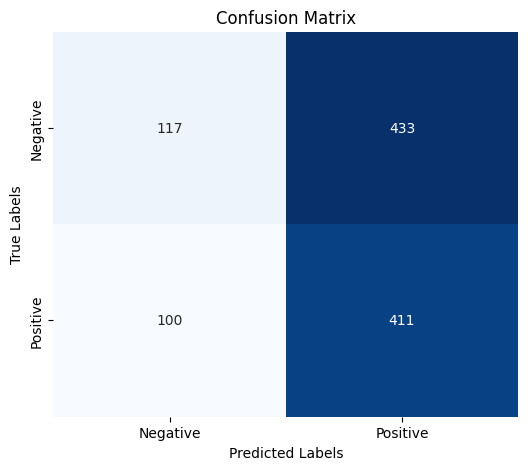

CPU times: user 4min 40s, sys: 1.69 s, total: 4min 42s
Wall time: 47 s


In [25]:
%%time

# create confusion matrix
evaluate_model_with_confusion_matrix(model, tokenizer, test_dataset)

**Comment**: As shown on the confusion matrix plot, the pre-trained model makes a substantial number of mistakes. Out of 1061, IndoBERT model made 433 false positives and 100 false negatives. The huge number of misclassifications underscores the importance of not relying on the general model. Instead, the model should be fine-tuned to adapt itself to the patterns of customer reviews on Tokopedia.
- False positive (Type I Error) is when the model incorrectly predicts positive class (positive sentiment) when the actual label is negative one (negative sentiment).
- False negative (Type II Error) occurs when the actual label is positive yet the model classifies the text as negative class (negative sentiment).

### **2.5 Fine-Tune IndoBERT Model**
Supervised fine-tuning is basically similar to the traditional model training with supervised learning but it involves a general pre-trained model. This fine-tuning allows a large language model to specialized in a specific task, including sentiment analysis. As shown earlier, the pre-trained model can actually perform the inference already but its performance needs to be improved. The supervised fine tunining here can improve the performance of the model by learning the patterns of text and labels in the dataset.

In [26]:
# define compute_metrics function
def compute_metrics(p):
    predictions, labels = p
    preds = np.argmax(predictions, axis=1)
    accuracy = accuracy_score(labels, preds)
    f1 = f1_score(labels, preds, average='weighted')
    return {"accuracy": accuracy, "f1_weighted": f1}

# define training arguments
training_args = TrainingArguments(
    run_name="sentiment_analysis_indobert",
    output_dir="./results",
    num_train_epochs=3,                   # 3 full passes over training set
    per_device_train_batch_size=8,        # 8 samples/batch
    per_device_eval_batch_size=8,         # 8 samples/batch
    warmup_steps=100,                     # steps for learning rate
    weight_decay=0.01,                    # penalize large weights
    logging_dir="./logs",                 # save logs
    eval_strategy="epoch",                # eval at tne end of epoch
    save_strategy="epoch",                # save model after epoch ends
    load_best_model_at_end=True,          # load best model
    metric_for_best_model="f1_weighted",  # selection of best model
    fp16=True,                            # mixed precision training
)

# define data collator
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

# define Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

In [28]:
# train model
start_time = time.time()
trainer.train()
end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: eddiechen289 (eddiechen289-independent) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


Epoch,Training Loss,Validation Loss,Accuracy,F1 Weighted
1,0.290000,0.117954,0.971725,0.971725
2,0.111500,0.101215,0.978322,0.978328
3,0.048600,0.115048,0.979265,0.979271


Training time: 248.43 seconds


#### **2.5.1 Check Performance Metrics**

In [29]:
# perform evaluation after training
start_time = time.time()
eval_results = trainer.evaluate()
tuned_model = pd.DataFrame(eval_results, index=['score']).transpose().round(4)
print(f"Evaluation time: {end_time - start_time:.2f} seconds")
print("Evaluation Results:")
display(tuned_model)

Evaluation time: -0.01 seconds
Evaluation Results:


,score
eval_loss,0.1150
eval_accuracy,0.9793
eval_f1_weighted,0.9793
eval_runtime,2.9255
eval_samples_per_second,362.6780
eval_steps_per_second,45.4630
epoch,3.0000


**Comment**: The evaluation output gives information about the model's performance during fine-tuning such as eval_loss, eval_accuracy, eval_f1_weighted, eval_runtime, eval_samples_per_second, eval_steps_per_second, and epoch. Now, let us break down one by one.
- `eval_loss` is the loss value on the test dataset. A lower value is desired as the model's predictions are closer to the true label.
- `eval_accuracy` is the percentage of correct predictions on the test set. A higher value indicates better performance.
- `eval_f1_weighted` is the weighted F1 score taking account of the number of sampels in each class.
- `eval_runtime` is how long is needed to run the evaluation on the test set. The lower the value, the faster the evaluation is.
- `eval_samples_per_second` corresponds to the number of sampels the model evaluated per second
- `eval_steps_per_second`: how many evaluations steps (bathes) were processed per second.
- `epoch` shows the eval is done after the 3rd training epoch.

#### **2.5.2 Classification Report**

In [30]:
# evaluate on test dataset
predictions = trainer.predict(test_dataset)
preds = np.argmax(predictions.predictions, axis=1)
true_labels = [label_map[example['Sentiment']] for example in test_dataset]

In [31]:
print("Classification Report:")
print(classification_report(true_labels,
                            preds,
                            target_names=['Negative', 'Positive'],
                            zero_division=1))

Classification Report:
              precision    recall  f1-score   support

    Negative       0.99      0.97      0.98       550
    Positive       0.97      0.99      0.98       511

    accuracy                           0.98      1061
   macro avg       0.98      0.98      0.98      1061
weighted avg       0.98      0.98      0.98      1061



**Comment**: After fine-tuning the base model for the sentiment analysis, the performance of the model is now excellent. Previously, on the same dataset, the base model has F1 of 0.54 but now the model has achieved F1 score of 0.98. The significant increase in F1 score highlights the importance of fine-tuning process on the dataset.

#### **2.5.2 Confusion Matrix**

In [61]:
# function to plot confusion matrix
def plot_confusion_matrix(true_labels, predictions, labels=["Negative", "Positive"]):
    cm = confusion_matrix(true_labels, predictions)
    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(cm,
                annot=True,
                fmt='d',
                cmap="Blues",
                xticklabels=labels,
                yticklabels=labels,
                cbar=False)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Tuned Model makes 17 FPs and 5 FNs')
    plt.show()

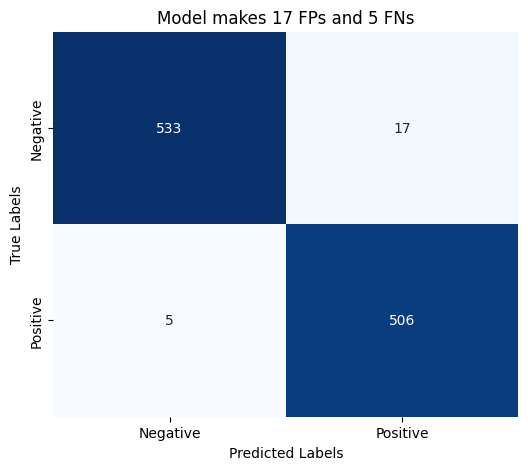

In [60]:
# make confusion plot
plot_confusion_matrix(true_labels, preds)

In [37]:
# data before fine-tuning
data_before = {
    'Category': ['True Positive', 'True Negative',
                 'False Positive', 'False Negative'],
    'Count': [245, 331, 219, 266]
}

# data after fine-tuning
data_after = {
    'Category': ['True Positive', 'True Negative',
                 'False Positive', 'False Negative'],
    'Count': [506, 533, 17, 5]
}

df_before = pd.DataFrame(data_before)
df_after = pd.DataFrame(data_after)
print('Before fine-tuning')
display(df_before)
print('\nAfter fine-tuning')
display(df_after)

Before fine-tuning


,Category,Count
0,True Positive,245
1,True Negative,331
2,False Positive,219
3,False Negative,266



After fine-tuning


,Category,Count
0,True Positive,506
1,True Negative,533
2,False Positive,17
3,False Negative,5


**Comment**:
- Before fine-tuning
  - Total samples: 1061
  - Accuracy = $\frac{TP+TN}{Total}=\frac{245+331}{1061}\approx 54.3%$

- After fine-tuning
  - Total samples: 1061
  - Accuracy = $\frac{506+533}{1061}\approx 97.9%$

- Improvement
  - Absolute improvement: $98.1 - 54.2 = +43.6$ point
  - Relative improvement (% increase over original): $\frac{43.6}{54.3}\times 100 \approx 80.2$ (significant improvement)

## **3 Explainable AI**
Before moving on to the local explanation on specific instance, let us demonstrate the model's inference first. As shown below, the model is tested using a customer review taken from Tokopedia. After obtaining the model's decision and the probability of the prediction, the model explanations will be given with different explainable AI techniques.

#### **3.1 Test Model's Prediction**

In [43]:
# reverse label map for decoding predictions
reverse_label_map = {v: k for k, v in label_map.items()}

# function to predict sentiment with probabilities
def predict_with_probabilities(text, model, tokenizer):
    inputs = tokenizer(text,
                       return_tensors="pt",
                       padding=True,
                       truncation=True,
                       max_length=512)
    inputs = {key: value.to(model.device) for key, value in inputs.items()}

    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits

    probabilities = F.softmax(logits, dim=-1)
    all_probabilities = probabilities.squeeze().cpu().numpy()
    predicted_class = torch.argmax(probabilities, dim=-1).item()
    predicted_label = reverse_label_map[predicted_class]
    predicted_probability = all_probabilities[predicted_class]

    return predicted_label, predicted_probability, all_probabilities

In [45]:
# test model with sample text
test_text = """
Produknya bagus dan ga usah di ragukan lagi.
Pelayanan sebelum dikirim buruk, kalau bisa expedisinya hadirkan 1 hari sampai.
perlu di tingkatkan lagi pelayanannya"""
predicted_sentiment, predicted_probability, all_probabilities = (
    predict_with_probabilities(test_text.lower(), model, tokenizer)
)
print(f"Predicted sentiment: {predicted_sentiment}")
print(f"Probability: {predicted_probability:.4f}")
print(f"All class probabilities: {[round(prob, 4) for prob in all_probabilities]}")
print(f"Tokens:\n{tokenizer.tokenize(test_text)}")

Predicted sentiment: Positive
Probability: 0.9928
All class probabilities: [0.0072, 0.9928]
Tokens:
['produknya', 'bagus', 'dan', 'ga', 'usah', 'di', 'ragu', '##kan', 'lagi', '.', 'pelayanan', 'sebelum', 'dikirim', 'buruk', ',', 'kalau', 'bisa', 'exp', '##edisi', '##nya', 'hadir', '##kan', '1', 'hari', 'sampai', '.', 'perlu', 'di', 'tingkatkan', 'lagi', 'pelayanannya']


**Comment**: The model can now be used to make a prediction on a real customer review on Tokopedia. Based on the prediction, positive sentiment is more likely to be the real label than the negative one. While this has helped much on the inference, it remains unknown how the model makes its decision. To explain the predictions, SHAP, Transformers Interpret, and Lime Text will be utilized. However, to note, while the prediction remains the same over different XAI techniques, the weights of each token will be slightly different as they use different ways of calculating the weights.

#### **3.2 Convert Model for Higer Precision**

In [46]:
# convert model to fp32 for XAI
model = model.to(torch.float32)

**Note**
- Mixed Precision (`fp16`) is primarily used during training to speed up computations and reduce memory usage. However, many XAI libraries (e.g., SHAP, LIME, transformers_interpret) are not optimized for fp16 and may produce incorrect results or fail entirely when working with fp16 models. Some operations in XAI methods (e.g., gradient calculations, attention visualization) require higher precision (e.g., `fp32`) to avoid numerical instability or inaccuracies.
- The `fp16` also can faster the inference speed.

In [52]:
id2label = {0: "NEGATIVE", 1: "POSITIVE"}
label2id = {"NEGATIVE": 0, "POSITIVE": 1}
# model.config.id2label = id2label
model.config.label2id = label2id

In [48]:
# Access the model's configuration
model_config = model.config
print(f"Number of labels: {model_config.num_labels}")
print(f"Labels: {model_config.id2label}")

Number of labels: 2
Labels: {0: 'NEGATIVE', 1: 'POSITIVE'}


In [49]:
# init classif pipeline
classifier = pipeline('text-classification',
                      top_k=None,
                      model=model,
                      tokenizer=tokenizer)

Device set to use cuda:0


In [50]:
# classify data
results = classifier(test_text)
print(results)

[[{'label': 'POSITIVE', 'score': 0.9928231239318848}, {'label': 'NEGATIVE', 'score': 0.007176882121711969}]]


### **3.1 Explain Prediction with SHapley Additive exPlanations (SHAP)**
In local explanation, SHAP explains an individual instance by showing how much each token in the text influenced the model's decision. Words dragging the prediction towards a higher Shapley score or positive class are highlighted while those lowering the score are also marked.

In [53]:
# init SHAP explainer
explainer = shap.Explainer(classifier)
shap_values = explainer([test_text])

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


  0%|          | 0/498 [00:00<?, ?it/s]

In [54]:
# get SHAP explanation
print(results)
shap.plots.text(shap_values)

[[{'label': 'POSITIVE', 'score': 0.9928231239318848}, {'label': 'NEGATIVE', 'score': 0.007176882121711969}]]


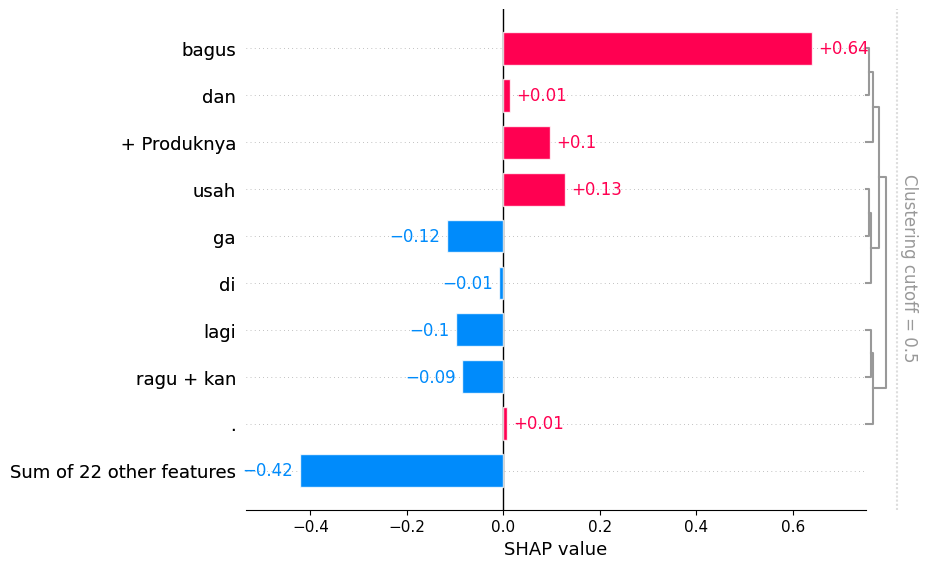

In [76]:
# create shap bar plot
shap.plots.bar(shap_values[0,:,"POSITIVE"])

**Comment**: The $x$-axis is the SHAP value, quantifying the contribution of each token on the $y$-axis to the prediction. In the plot, *bagus* has the most significant impact on the prediction to positive sentiment with the largest SHAP value of +64.

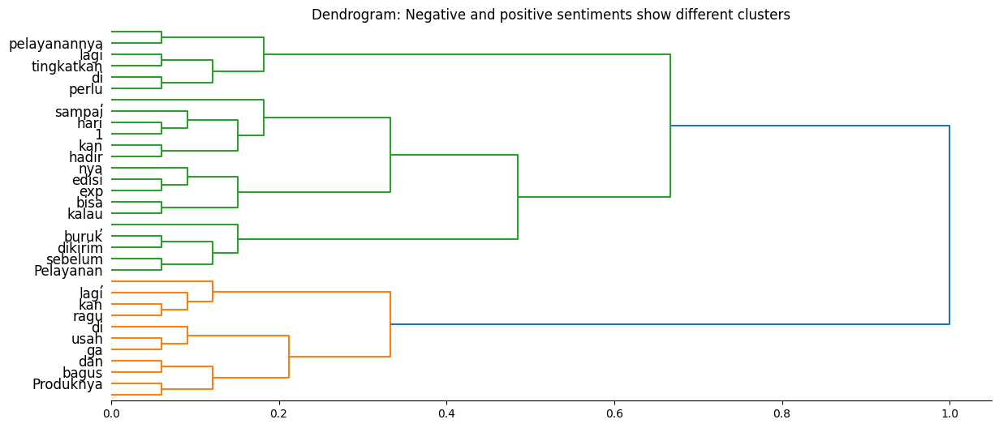

In [75]:
# create dendrogram
cluster_matrix = shap_values.clustering
labels = list(shap_values.feature_names[0])

fig, ax = plt.subplots(figsize=(14, 6))
hierarchy.dendrogram(cluster_matrix[0], labels=labels, orientation='right')
plt.yticks(fontsize=12)
plt.title('Dendrogram: Negative and positive sentiments show different clusters')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
plt.show()

**Comment**: The dendrogram adds a little bit more information about the mixed sentiment labels in the instance. The orange hierarchy indicates the positive sentiment classs which has the biggest contribution to the overall sentiment in the instance but the dendrogram also contains other hierarchy showing the negative perception in the instance with the green line.

### **3.2 Explain Prediction with Transformers Interpret**
Transformer interpet is another way of explaining how the transformer-based model makes its prediction. Unlike SHAP with its Shapley values, Transformer Interpret relies on word attribution, identifying which words in the text contributes the most to the model's prediction. It is crucial to note that SHAP and Transformers Interpet uses different approaches in computing contributions. While SHAP uses Shapley values from cooperative game theory to estimate the contribution of each token to the final prediction, Transformers Interpret uses gradient-based approach.

In [58]:
explainer = SequenceClassificationExplainer(model, tokenizer)
word_attributions = explainer(test_text)
explainer.visualize()

In [70]:
word_attributions_df = pd.DataFrame(
    word_attributions,
    columns=['Word', 'Attribution']).sort_values(by='Attribution', ascending=True
)
word_attributions_df.nlargest(n=10, columns='Attribution')

,Word,Attribution
29,tingkatkan,0.473344
28,di,0.295388
26,.,0.277533
15,",",0.227284
2,bagus,0.153658
3,dan,0.127691
1,produknya,0.121455
22,##kan,0.120614
10,.,0.120404
17,bisa,0.105947


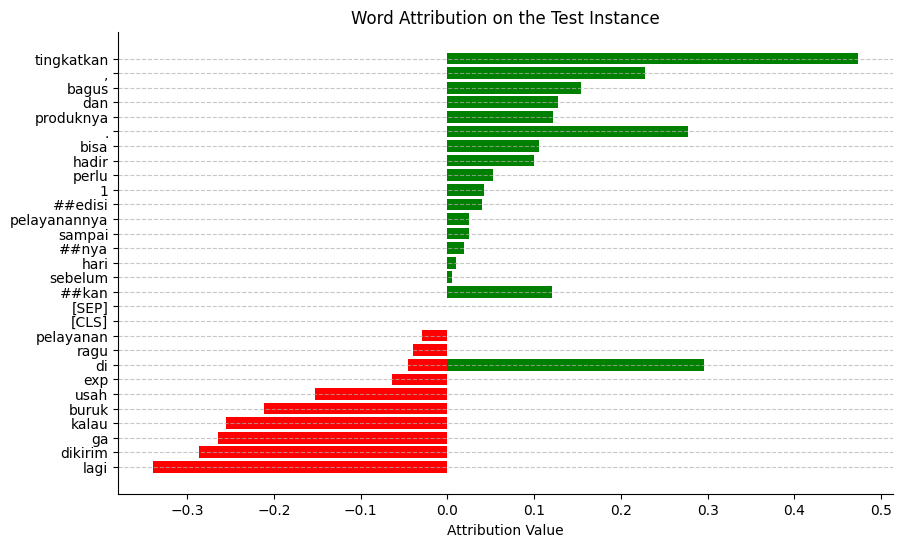

In [71]:
plt.figure(figsize=(10, 6))
plt.barh(word_attributions_df['Word'],
         word_attributions_df['Attribution'],
         color=['red' if x < 0 else 'green' for x in word_attributions_df['Attribution']])
# for index, value in enumerate(word_attributions_df['Attribution']):
#     plt.text(value, index, f'{value:.2f}', va='center', ha='left', fontsize=10)
plt.xlabel('Attribution Value')
plt.title('Word Attribution on the Test Instance')
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

**Comment**: The output generated by Transformer Interpret is slightly different from SHAP's output. In SHAP, the most contributing token was *bagus* but in Transformer Interpret, *tingkatkan* has the bigger contribution to the positive sentiment class. Token *bagus* also contributes to the positive class but its contribution is not as substantial as token *tingkatkan*.

### **3.3 Explain Prediction LIME Text**

In [72]:
explainer_lime = LimeTextExplainer(class_names=['Negative', 'Positive'])

def predict_proba(texts):
    inputs = tokenizer(texts,
                       return_tensors="pt",
                       padding=True,
                       truncation=True,
                       max_length=512)

    inputs = {k: v.to(model.device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
        probabilities = F.softmax(outputs.logits, dim=-1)
    return probabilities.cpu().numpy()

exp = explainer_lime.explain_instance(test_text,
                                      predict_proba,
                                      num_features=10)
exp.show_in_notebook(text=True)

## **4 Save Model**

In [ ]:
# # create private repository on Hugging Face
# api = HfApi()
# api.create_repo(repo_id="finetuned-indobert-sentiment", private=True, token=token)

RepoUrl('https://huggingface.co/eddiechen289/finetuned-indobert-sentiment', endpoint='https://huggingface.co', repo_type='model', repo_id='eddiechen289/finetuned-indobert-sentiment')

In [ ]:
# define token and repository details
token = "TOKEN"
username = "eddiechen289"
repo_name = "finetuned-indobert-sentiment"

# push to HF hub with token
model.push_to_hub(f"{username}/{repo_name}", token=token)
tokenizer.push_to_hub(f"{username}/{repo_name}", token=token)

README.md:   0%|          | 0.00/5.17k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/442M [00:00<?, ?B/s]

No files have been modified since last commit. Skipping to prevent empty commit.


CommitInfo(commit_url='https://huggingface.co/eddiechen289/finetuned-indobert-sentiment/commit/7812c2c9cdf1633f9d579e7cdee7b910554d25a4', commit_message='Upload tokenizer', commit_description='', oid='7812c2c9cdf1633f9d579e7cdee7b910554d25a4', pr_url=None, repo_url=RepoUrl('https://huggingface.co/eddiechen289/finetuned-indobert-sentiment', endpoint='https://huggingface.co', repo_type='model', repo_id='eddiechen289/finetuned-indobert-sentiment'), pr_revision=None, pr_num=None)

# **END**

In [ ]:
# tokenize input text
inputs = tokenizer(
    test_text,
    return_tensors="pt",
    padding=True,
    truncation=True,
    max_length=512
)

# move input tensors to same device as model
inputs = {k: v.to(model.device) for k, v in inputs.items()}

# get attention weights
outputs = model(**inputs, output_attentions=True)
attention = outputs.attentions

# convert token IDs to tokens
tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

# visualize attention
head_view(attention, tokens)

BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


<IPython.core.display.Javascript object>